# Wage model

In this notebook, we tune a bayesian linear regression for model wages across the Toronto metropolitan area. We use the following public dataset from Statistics Canada:

* Survey of Labour and Income Dynamics (SLID)

In [ ]:
# Import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pymc as pm
import arviz as az
import xarray as xr
import pymc.sampling.jax as pmjax
import jax
import pytensor.tensor as pt

from scipy.stats import gamma

# Configurations
%config InlineBackend.figure_format = 'retina'
az.style.use("arviz-darkgrid")

# Set random seed
RANDOM_SEED = 8927
rng = np.random.default_rng(RANDOM_SEED)

In [2]:
# Run this cell to set up ["CPU"] as the default backend for JAX. NOTE: Any change to the backend requires a restart of the kernel.
# CPU seems to be faster than GPU for this model
jax.config.update('jax_platform_name', 'cpu')
print(f"JAX default backend: {jax.default_backend()}")

JAX default backend: cpu


In [3]:
import warnings
warnings.filterwarnings("error")

## 1. Auxiliary functions

In [4]:
# Define a function to adjust monetary values with the CPI
def adjust_cpi(
    data: pd.DataFrame,
    adj_col: str,
    year_col: str,
    month_col: str = None,
    base_year: int = 2023,
    base_month: int = None,
    geo: str = "Toronto",
) -> pd.Series:
    """
    Function to adjust a monetary value ($CAD) to the base year using CPI data

    Parameters
    ----------
    data : pd.DataFrame
        DataFrame containing the monetary values to be adjusted

    adj_col : str
        Column name of the monetary values to be adjusted

    year_col : str or int
        Column name or integer containing the year of the monetary values to be adjusted

    month_col : str or int, optional
        Column name or integer containing the month of the monetary values to be adjusted, by default None

    base_year : int, optional
        Base year to adjust the values to, by default 2023
        Options are integers between 1987 and 2023

    base_month : int, optional
        Base month to adjust the values to, by default None
        Options are integers between 1 and 12, or None for annual adjustment

    geo : str, optional
        Geography to use for CPI data, by default 'Toronto'.
        Options are {'Canada','Ontario','Toronto'}
    """

    # Load CPI data
    cpi = pd.read_csv("../../Data/cpi1987_2023.csv")

    # Define columns of interest
    if month_col is None:
        cols = [year_col, adj_col]
        merge_cols = [year_col, "month"]
    else:
        cols = [year_col, month_col, adj_col]
        merge_cols = [year_col, month_col]

    # Copy the data (only columns of interest)
    adj_data = data[cols].copy()

    # Annual adjustment (if months is not provided)
    # NOTE: If months are not provided, the CPI indexing is done on an annual basis (as reference to December of each year)
    if month_col is None:
        adj_data["month"] = 12
        base_month = 12

    # Calculate base CPI (for the base_year and base_month)
    base_index = cpi[(cpi["geo"] == geo)\
                     & (cpi["year"] == base_year)\
                     & (cpi["month"] == base_month)]["value"].to_list()[0]
    
    # Merge the CPI data with the data
    adj_data = adj_data.merge(
        cpi[cpi["geo"] == geo],
        left_on=merge_cols,
        right_on=["year", "month"],
        how="left",
    )

    # Calculate the adjusted values
    adj_data[f"{adj_col}"] = adj_data[adj_col] * base_index / adj_data["value"]

    return adj_data[f"{adj_col}"]

In [5]:
def plot_posterior_pred_check(var_obj, ndata, nchains, ndraws, infer_data, n_samples=100):
    """Plot posterior predictive check for a given variable and compare it with the observed data distribution"""
    posterior_dist = np.sort(infer_data.posterior_predictive[f"{var_obj}"].values, axis=2).mean(axis=(0,1))

    observed = infer_data.observed_data[f"{var_obj}"].values

    posterior_samples = infer_data.posterior_predictive[f"{var_obj}"].values.reshape(nchains * ndraws, ndata)
    posterior_samples = posterior_samples[np.random.choice(posterior_samples.shape[0], n_samples, replace=False), :]

    fig, ax = plt.subplots()

    for i, sample in enumerate(posterior_samples):
        if i == n_samples - 1:
            sns.kdeplot(sample, ax=ax, color='grey', alpha=0.2, label='posterior pred')
        else:
            sns.kdeplot(sample, ax=ax, color='grey', alpha=0.05)

    sns.kdeplot(observed, label='wage', ax=ax, color='C0')
    sns.kdeplot(posterior_dist, label=f'{var_obj} (mean post. pred)', ax=ax, color='C1')
    
    ax.legend(loc='upper right', fontsize=11);
    ax.set_title(f"Posterior predictive check - {var_obj}", fontweight="bold");
    ax.set_xlabel("Wage ($CAD)", fontsize=11);
    ax.set_ylabel("Density", fontsize=11);

    # Set x-axis limits
    ax.set_xlim(0, 0.6e6);

    # Adjust axis ticks font size
    ax.tick_params(axis="both", labelsize=11);

In [6]:
# Function to standardize a pandas series (based on statistical rethinking book) - Similar to StandardScaler in sklearn
def StandardScaler(series):
    """Standardize a pandas series"""
    std_series = (series - series.mean()) / series.std()
    return std_series

# Function to standardize a pandas series using MinMax technique - Similar to MinMax in sklearn
def MinMaxScaler(series):
    """Standardize a pandas series using MinMax technique"""
    minmax_series = ((series - series.min()) / (series.max() - series.min())) + 0.0001
    return minmax_series

## 2. Import data

In [7]:
slid = pd.read_parquet('../../Data/Survey of Labour and Income Dynamics (SLID)/compilates/slid_personal_std.parquet')

ImportError: Unable to find a usable engine; tried using: 'pyarrow', 'fastparquet'.
A suitable version of pyarrow or fastparquet is required for parquet support.
Trying to import the above resulted in these errors:
 - Missing optional dependency 'pyarrow'. pyarrow is required for parquet support. Use pip or conda to install pyarrow.
 - Missing optional dependency 'fastparquet'. fastparquet is required for parquet support. Use pip or conda to install fastparquet.

In [8]:
data = slid[["YEAR","YRXFTE11","WGSAL42","ALFST28","WEIGHT","ECAGE26","FLLPRT1","HLEVEG18","ECSEX99","NAI3G10","NOCG2E6",
             "ML01V28","ML02V28","ML03V28","ML04V28","ML05V28","ML06V28","ML07V28","ML08V28","ML09V28","ML10V28","ML11V28","ML12V28",
             "FSEIN28","FSEUI28","FPDWK28","TOTHRP1","TTINC42","EARNG42","SEMP42","OTTXM42","MTINC42","MAJRI42","MJACG26","IMPHWE1",
             "UNCOLL1","STUDTF26","REAWPT1","RCUNIV20","RCCOLL20","PUBPV10","NBJBS28","NBEMA10","NBEMPL1","MULTJ28","MTLSWK28",
             "JOBDUR1","FLLPRT20","CLWKR1","CMPHI20"]].reset_index(drop=True).copy()

### NOTE: Add previous history (unemployed time), children (to check if the effect is strong in females, altough probably wont be included in the final version)

NameError: name 'slid' is not defined

In [9]:
# Rename columns
data = data.rename(columns={
    "YEAR": "year",
    "YRXFTE11": "exp",
    "WGSAL42": "salary",
    "ALFST28": "lfs",
    "WEIGHT": "weight",
    "ECAGE26": "age",
    "FLLPRT1": "ftpt",
    "HLEVEG18": "edu",
    "ECSEX99": "sex",
    "NAI3G10": "industry",
    "NOCG2E6": "occup",
    "ML01V28": "lab_status_01",
    "ML02V28": "lab_status_02",
    "ML03V28": "lab_status_03",
    "ML04V28": "lab_status_04",
    "ML05V28": "lab_status_05",
    "ML06V28": "lab_status_06",
    "ML07V28": "lab_status_07",
    "ML08V28": "lab_status_08",
    "ML09V28": "lab_status_09",
    "ML10V28": "lab_status_10",
    "ML11V28": "lab_status_11",
    "ML12V28": "lab_status_12",
    "FSEIN28": "self_inc",
    "FSEUI28": "self_uninc",
    "FPDWK28": "paid_work",
    "TOTHRP1": "hours_paid",
    "TTINC42": "total_inc",
    "EARNG42": "earnings",
    "SEMP42": "self_emp_inc",
    "OTTXM42": "other_inc",
    "MTINC42": "market_inc",
    "MAJRI42": "major_source_inc",
    "MJACG26" : "major_activity",
    "IMPHWE1": "hourly_wage",
    "UNCOLL1": "union",
    "STUDTF26": "student_status",
    "REAWPT1": "reason_pt",
    "CMPHI20": "grad_highschool_refyear",
    "RCCOLL20": "grad_college_refyear",
    "RCUNIV20": "grad_univ_refyear",
    "PUBPV10": "employment_sector",
    "NBJBS28": "num_jobs",
    "NBEMA10": "firm_size",
    "NBEMPL1": "loc_size",
    "MULTJ28": "multiple_jobs",
    "MTLSWK28": "months_last_worked",
    "JOBDUR1": "tenure",
    "FLLPRT20": "student_status_2",
    "CLWKR1": "class_worker",
    })

### Dataset preparation: 
# Adjust wages using base year cpi
data["salary"] = adjust_cpi(data=data, adj_col="salary", year_col="year", base_year=2022, geo="Toronto")

# Adjust hourly wage using base year cpi
data["hourly_wage"] = adjust_cpi(data=data, adj_col="hourly_wage", year_col="year", base_year=2022, geo="Toronto")

# Create employed flag-column (indicated if the person was employeed any time for the reference year)
data["employed"] = ~(data["lfs"].isin([None, "not in the labour force all year", "unemployed all year",
                                       "unemployed part-year, not in labour force part-year"])) * 1

# Count the number of months where == employed
employment_status_cols = ["lab_status_01",
                          "lab_status_02",
                          "lab_status_03",
                          "lab_status_04",
                          "lab_status_05",
                          "lab_status_06",
                          "lab_status_07",
                          "lab_status_08",
                          "lab_status_09",
                          "lab_status_10",
                          "lab_status_11",
                          "lab_status_12"]
data["months_emp"] = data[employment_status_cols].apply(lambda x: (x == "employed") * 1).sum(axis=1)
data.drop(columns=employment_status_cols, inplace=True)

# Create self-employed flag-column (indicated if the person was self-employed any time for the reference year)
data["self_emp"] = ((data["self_inc"] == "yes") | (data["self_uninc"] == "yes")) * 1

# Convert age to float
data["age"] = data["age"].replace("80+", 80).astype(float)

# Change category order and get one-hot encoding for sex
data["sex"] = data["sex"].cat.reorder_categories(["Male", "Female"])
data["sex"] = pd.get_dummies(data["sex"], drop_first=True) * 1

# Convert education level to one-hot encoding corresponding to the highest level of education achieved (with certificate)
## NOTE: The encoding assumes that the education level is cumulative. e.g. if the person has a bachelor's degree, it is assumed that the person
## has also completed high school and elementary school. However, for university levels (bachelors and above), it is assumed that the person
## has not completed a post-secondary certificate (e.g. college certificate).
data["elementary_edu"] = (data["edu"] >= '5-8 years of elementary school') * 1
data["highschool_edu"] = (data["edu"] >= 'graduated high school') * 1
data["postsec_edu"] = ((data["edu"] == 'non-university postsecondary certificate') | (data["edu"] == 'university certificate below bachelor')) * 1
data["undergrad_edu"] = (data["edu"] >= "bachelor's degree") * 1
data["graduate_edu"] = (data["edu"] >= 'university certificate above bachelor') * 1

# Create education level column for the hierarchical model
data["edu_level"] = ((data["edu"] < "5-8 years of elementary school") * 1) + (((data["edu"] >= "5-8 years of elementary school") & (data["edu"] < "graduated high school")) * 2) +\
                    (((data["edu"] >= "graduated high school") & (data["edu"] < "non-university postsecondary certificate")) * 3) +\
                    (((data["edu"] >= "non-university postsecondary certificate") & (data["edu"] < "bachelor's degree")) * 4) +\
                    (((data["edu"] >= "bachelor's degree") & (data["edu"] < "university certificate above bachelor")) * 5) +\
                    ((data["edu"] >= "university certificate above bachelor") * 6)

# Convert union status to one-hot encoding
data["union"] = ~(data["union"].isin(["no",None])) * 1

# Convert student status to one-hot encoding
data["student_status"] = (data["student_status"] == "yes") * 1

# Convert graduation from high school, college, or university to one-hot encoding
data["grad_highschool_refyear"] = (data["grad_highschool_refyear"] == "yes") * 1
data["grad_college_refyear"] = (data["grad_college_refyear"] == "yes") * 1
data["grad_univ_refyear"] = (data["grad_univ_refyear"] == "yes") * 1

# Convert employment sector to one-hot encoding
data["public_sector"] = (data["employment_sector"] == "public sector") * 1

# Convert multiple jobs holder to one-hot encoding
data["multiple_jobs"] = (data["multiple_jobs"] == "yes") * 1

# Convert firm size to numeric
data["firm_size"] = data["firm_size"].replace({"<20": 1, "20 to 99": 20, "100 to 499": 100, "500 to 999": 500, "+1000": 1000})
data["firm_size"] = data["firm_size"].astype(float)

# Convert location size to numeric
data["loc_size"] = data["loc_size"].replace({"<20": 1, "20 to 99": 20, "100 to 499": 100, "500 to 999": 500, "+1000": 1000})
data["loc_size"] = data["loc_size"].astype(float)

# # Convert full-time/part-time status to one-hot encoding
# data["ftpt"] = (data["ftpt"] == "part-time") * 1
# data["ftpt"] = data["ftpt"].astype(float)

In [10]:
## TODO: Check self-employment for records with lower salaries or not employed but with salary (self-employment)
## TODO: Include Part-time/Full-time status as a predictor

In [11]:
slid["NAI3G10"].value_counts()

NAI3G10
trade                                              25110
manufacturing                                      23744
health care and social assistance                  17025
educational services                               11863
accommodation and food services                    11452
construction                                        9959
public administration                               9818
professional, scientific and technical services     9085
finance, insurance, real estate and leasing         9002
information, culture and recreation                 7581
transportation and warehousing                      6982
other services                                      6830
business, building and other support services       6361
agriculture                                         3295
forestry, fishing, mining, oil and gas              1807
utilities                                           1698
Name: count, dtype: int64

In [12]:
slid["NOCG2E6"].value_counts()

NOCG2E6
clerical and supervisor occupations                               16384
middle management                                                 13116
retail salespersons, sales clerks, cashiers                       10833
machine operators and assemblers in manufacturing                 10262
sales and service                                                  9213
natural and applied sciences                                       9175
other trades                                                       8615
financial, secretarial and administrative                          7990
teachers and professors                                            7033
transport and equipment operators                                  5856
occupations in social science, government service and religion     5665
occupations unique to primary industry                             5404
chefs and cooks, food and beverage service                         5336
wholesale, technical, insurance, real estate sales speci

In [13]:
# # Drop NaNs
data = data.dropna(subset=["exp"])
data = data.dropna(subset=["tenure"])
data = data.dropna(subset=["firm_size"])
data = data.dropna(subset=["loc_size"])

# # Filter data
data = data[(data["salary"]>0)\
          & ((data["year"]>=2010) & (data["year"]<2011))\
          # & ((data["industry"]=="educational services") | (data["industry"]=="trade"))\
          # & (data["industry"]=="educational services")\
          # & (data["occup"]=="teachers and professors")\
          # & (data["industry"]=="construction")\
          # & (data["occup"]=="trades helpers, construction, and transportation labourers")\
          # & (data["industry"]=="trade")\
          # & (data["occup"]=="construction trades")\
          # & (data["ftpt"]=="full-time")\
          & (data["months_emp"]>=12)\
          & (data["major_activity"]=="working")\
          & (data["paid_work"]=="yes")\
          & (data["major_source_inc"]=="wages and salaries")
        ]

data = data[["year","lfs","exp","salary","weight","age","ftpt","edu","sex","industry","occup","self_emp",
             "elementary_edu","highschool_edu","postsec_edu","undergrad_edu","graduate_edu","union",
             "student_status","grad_highschool_refyear","grad_college_refyear","grad_univ_refyear",
             "public_sector","multiple_jobs","firm_size","loc_size","tenure","edu_level"]].copy()

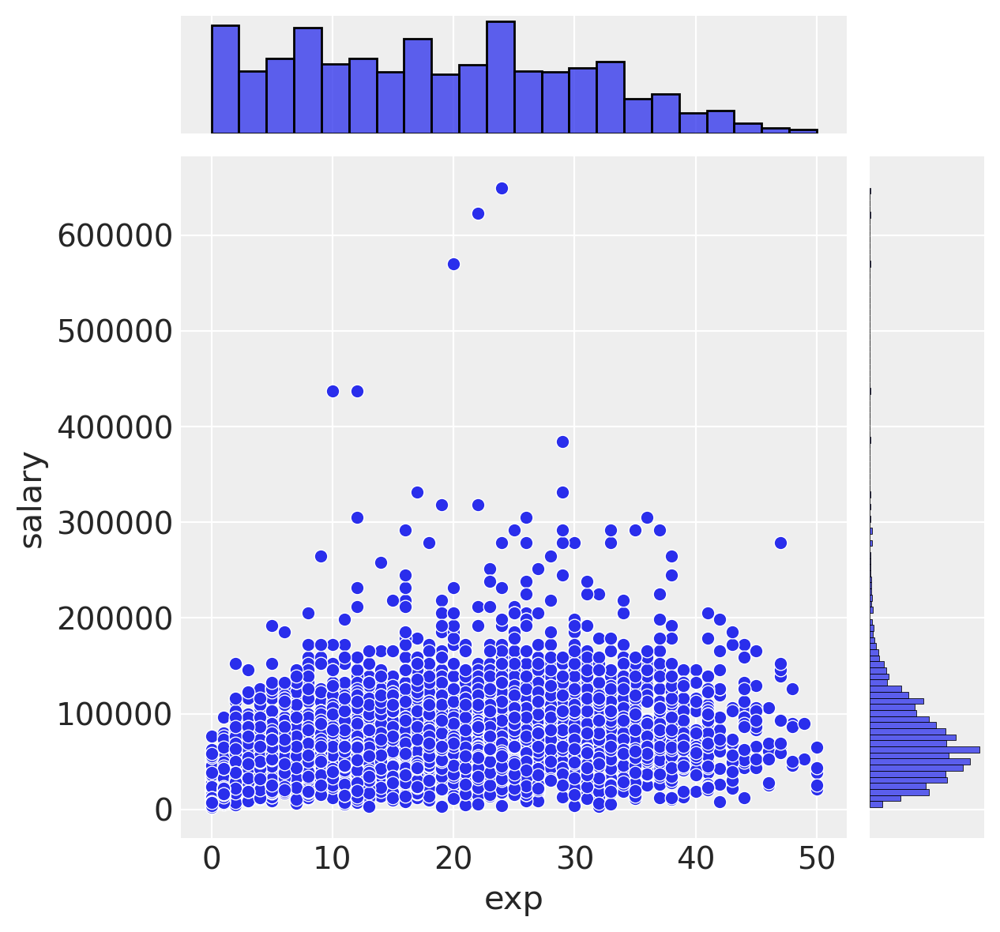

In [14]:
# Ignore warnings
import warnings
warnings.filterwarnings('ignore')

sns.jointplot(data=data, x="exp", y="salary", kind="scatter");

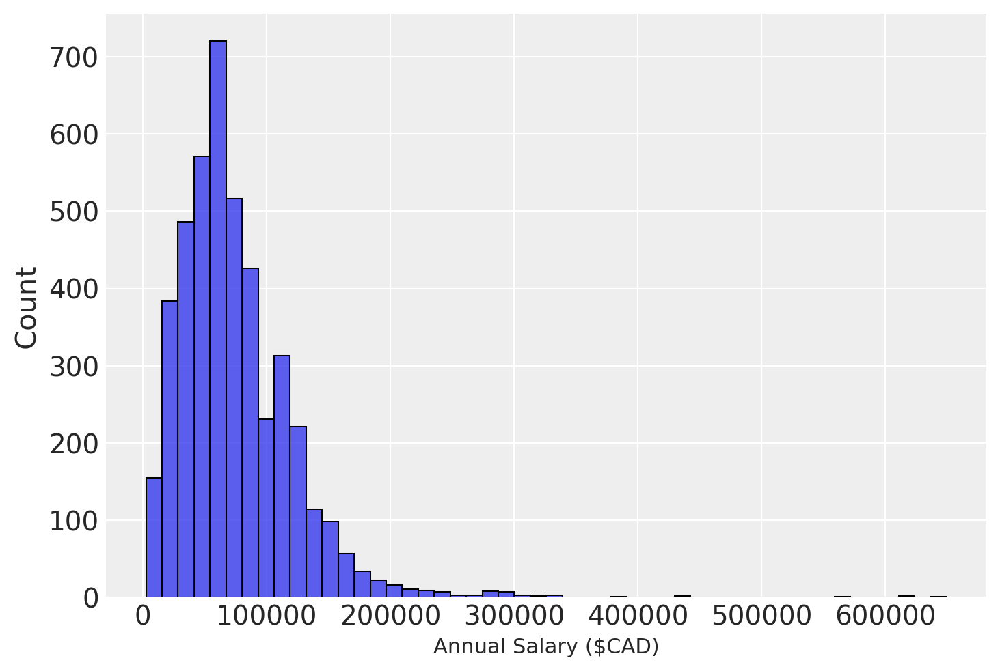

In [15]:
sns.histplot(data=data, x="salary", bins=50);

plt.xlabel("Annual Salary ($CAD)", fontsize=11);

# Tests

In [16]:
df = data[["industry","occup","ftpt","sex","self_emp","union","public_sector","multiple_jobs","salary"]]

In [17]:
# df["ind"] = pd.factorize(df["industry"])[0]
df = df.rename(columns={"industry":"ind", "occup": "occ"})
df["ptm"] = pd.factorize(df["ftpt"])[0]
df["gender"] = pd.factorize(df["sex"])[0]
df["self"] = pd.factorize(df["self_emp"])[0]
df["union"] = pd.factorize(df["union"])[0]
df["public_sector"] = pd.factorize(df["public_sector"])[0]
df["multiple_jobs"] = pd.factorize(df["multiple_jobs"])[0]

df = df.drop(columns=["ftpt","sex"])
df.head(3)

,ind,occ,self_emp,union,public_sector,multiple_jobs,salary,ptm,gender,self
2350,construction,middle management,0,0,0,0,54352.891156,0,0,0
2353,"information, culture and recreation",other trades,0,1,1,0,41096.088435,1,0,0
2361,trade,"wholesale, technical, insurance, real estate s...",0,0,0,0,79540.816327,0,0,0


# 3-Level test

In [110]:
ind_idx, industries = pd.factorize(df['ind'])
occ_idx, occupations = pd.factorize(df['occ'])
pti_idx, pti = pd.factorize(df['ptm'])
self_idx, self_emps = pd.factorize(df['self'])
union_idx, unions = pd.factorize(df['union'])
public_idx, public_sectors = pd.factorize(df['public_sector'])
multi_idx, multi_jobs = pd.factorize(df['multiple_jobs'])
gender_idx, genders = pd.factorize(df['gender'])
salary = df['salary'].values

COORDS = {
    "obs": np.arange(df.shape[0]),
    "ind": industries,
    "occ": occupations,
    "pti": pti
}

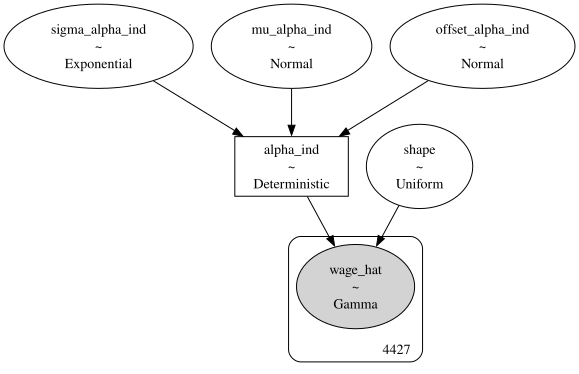

In [111]:
with pm.Model(coords=COORDS) as test:
    # Data
    # data_ind = pm.MutableData('data_ind', ind_idx)
    # data_occ = pm.MutableData('data_occ', occ_idx)
    # data_pti = pm.MutableData('data_pti', pti_idx)
    # data_selfemp = pm.MutableData('data_selfemp', self_idx)
    # data_union = pm.MutableData('data_union', union_idx)
    # data_public = pm.MutableData('data_public', public_idx)
    # data_multijob = pm.MutableData('data_multijob', multi_idx)
    # data_gender = pm.MutableData('data_gender', gender_idx)

    # Hyperpriors
    mu_alpha_ind = pm.Normal('mu_alpha_ind', mu=0, sigma=10)
    sigma_alpha_ind = pm.Exponential('sigma_alpha_ind', 1)
    # mu_alpha_occ = pm.Normal('mu_alpha_occ', mu=0, sigma=10, dims='occ')
    # sigma_alpha_occ = pm.Exponential('sigma_alpha_occ', 1)
    # mu_beta_pti = pm.Normal('mu_beta_pti', mu=10000, sigma=50000, dims='ind')
    # sigma_beta_pti = pm.Exponential('sigma_beta_pti', 1)
    # mu_beta_selfemp = pm.Normal('mu_beta_selfemp', mu=10000, sigma=50000, dims='ind')
    # sigma_beta_selfemp = pm.Exponential('sigma_beta_selfemp', 1)
    # mu_beta_union = pm.Normal('mu_beta_union', mu=10000, sigma=50000, dims='ind')
    # sigma_beta_union = pm.Exponential('sigma_beta_union', 1)
    # mu_beta_public = pm.Normal('mu_beta_public', mu=10000, sigma=50000, dims='ind')
    # sigma_beta_public = pm.Exponential('sigma_beta_public', 1)
    # mu_beta_multijob = pm.Normal('mu_beta_multijob', mu=10000, sigma=50000, dims='ind')
    # sigma_beta_multijob = pm.Exponential('sigma_beta_multijob', 1)
    # mu_beta_gender = pm.Normal('mu_beta_gender', mu=10000, sigma=50000, dims='ind')
    # sigma_beta_gender = pm.Exponential('sigma_beta_gender', 1)

    # Priors
    offset_alpha_ind = pm.Normal('offset_alpha_ind', mu=0, sigma=1)
    alpha_ind = pm.Deterministic('alpha_ind', mu_alpha_ind + offset_alpha_ind * sigma_alpha_ind)
    # offset_alpha_occ = pm.Normal('offset_alpha_occ', mu=0, sigma=1, dims='occ')
    # alpha_occ = pm.Deterministic('alpha_occ', mu_alpha_occ + offset_alpha_occ * sigma_alpha_occ)
    # offset_beta_pti = pm.Normal('offset_beta_pti', mu=0, sigma=1, dims='ind')
    # beta_pti = pm.Deterministic('beta_pti', mu_beta_pti + offset_beta_pti * sigma_beta_pti)
    # offset_beta_selfemp = pm.Normal('offset_beta_selfemp', mu=0, sigma=1, dims='ind')
    # beta_selfemp = pm.Deterministic('beta_selfemp', mu_beta_selfemp + offset_beta_selfemp * sigma_beta_selfemp)
    # offset_beta_union = pm.Normal('offset_beta_union', mu=0, sigma=1, dims='ind')
    # beta_union = pm.Deterministic('beta_union', mu_beta_union + offset_beta_union * sigma_beta_union)
    # offset_beta_public = pm.Normal('offset_beta_public', mu=0, sigma=1, dims='ind')
    # beta_public = pm.Deterministic('beta_public', mu_beta_public + offset_beta_public * sigma_beta_public)
    # offset_beta_multijob = pm.Normal('offset_beta_multijob', mu=0, sigma=1, dims='ind')
    # beta_multijob = pm.Deterministic('beta_multijob', mu_beta_multijob + offset_beta_multijob * sigma_beta_multijob)
    # offset_beta_gender = pm.Normal('offset_beta_gender', mu=0, sigma=1, dims='ind')
    # beta_gender = pm.Deterministic('beta_gender', mu_beta_gender + offset_beta_gender * sigma_beta_gender)

    # alpha_ind = pm.Normal('alpha_ind', mu=0, sigma=10, dims='ind')
    # alpha_occ = pm.Normal('alpha_occ', mu=0, sigma=10, dims='occ')
    # beta_pti = pm.Normal('beta_pti', mu=50000, sigma=10000, dims='ind')
    # beta_selfemp = pm.Normal('beta_selfemp', mu=0, sigma=100000, dims='ind')
    # beta_union = pm.Normal('beta_union', mu=0, sigma=100000, dims='ind')
    # beta_public = pm.Normal('beta_public', mu=0, sigma=100000, dims='ind')
    # beta_multijob = pm.Normal('beta_multijob', mu=0, sigma=100000, dims='ind')
    # beta_gender = pm.Normal('beta_gender', mu=0, sigma=100000, dims='ind')


    avg_sal = alpha_ind

    # Expected value:
    # Level 1: Industries
    # avg_sal_ind = alpha_ind[data_ind]
    # # Level 2: Occupations
    # avg_sal_occ = avg_sal_ind + alpha_occ[data_occ]
    # Level 3: Workers
    # avg_sal = (avg_sal_occ + beta_pti[data_ind] * data_pti #+ beta_selfemp[data_ind] * data_selfemp + beta_union[data_ind] * data_union
                # + beta_public[data_ind] * data_public + beta_multijob[data_ind] * data_multijob + beta_gender[data_ind] * data_gender
                #)

    # Model error
    # sigma = pm.Exponential('sigma', 1)

    # # Likelihood
    # y = pm.Normal('y', mu=avg_sal, sigma=sigma, observed=salary)

    # # Model error
    shape = pm.Uniform("shape", 0, 100)

    # Expected value
    mu = pm.math.exp(avg_sal)

    # Likelihood
    y = pm.Gamma("wage_hat", beta=shape/mu, alpha=shape, observed=salary)
    # y = pm.Normal('y', mu=avg_sal_ind, sigma=sigma, observed=salary)
    # y = pm.Lognormal("wage_hat", mu=avg_sal_ind, sigma=sigma, observed=salary)

# Model graph
pm.model_to_graphviz(test)

In [112]:
with test:
    trace = pmjax.sample_numpyro_nuts(draws=10000, tune=10000, target_accept=0.95)
    # trace = pmjax.sample_numpyro_nuts()

Compiling...
Compilation time =  0:00:00.813783
Sampling...


  0%|          | 0/20000 [00:00<?, ?it/s]

  0%|          | 0/20000 [00:00<?, ?it/s]

  0%|          | 0/20000 [00:00<?, ?it/s]

  0%|          | 0/20000 [00:00<?, ?it/s]

Sampling time =  0:00:41.225939
Transforming variables...
Transformation time =  0:00:00.092577


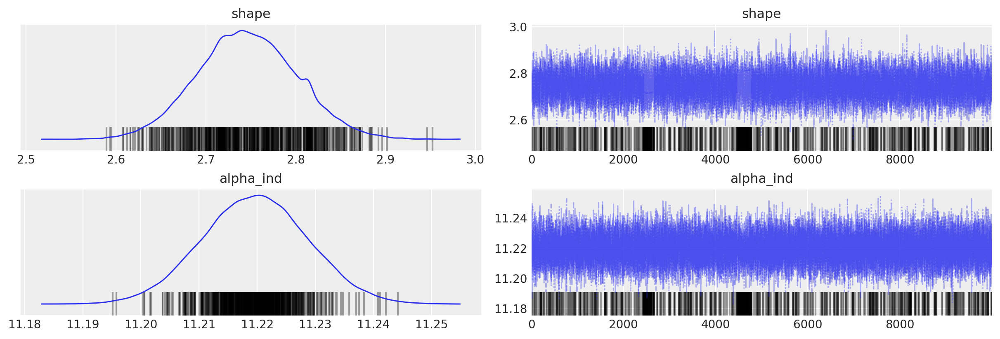

In [113]:
az.plot_trace(trace, var_names=["~offset","~mu","~sigma_"], filter_vars="like", combined=True);

In [114]:
pm.summary(trace, var_names=["~offset","~mu","~sigma_"], filter_vars="like")

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
shape,2.746,0.055,2.645,2.852,0.001,0.0,12562.0,16260.0,1.0
alpha_ind,11.220,0.009,11.202,11.237,0.000,0.0,39319.0,27721.0,1.0


In [93]:
pm.summary(trace, var_names=["~offset","~mu","~sigma_"], filter_vars="like").to_csv("wages_model_summary3.csv")

Sampling: [wage_hat]


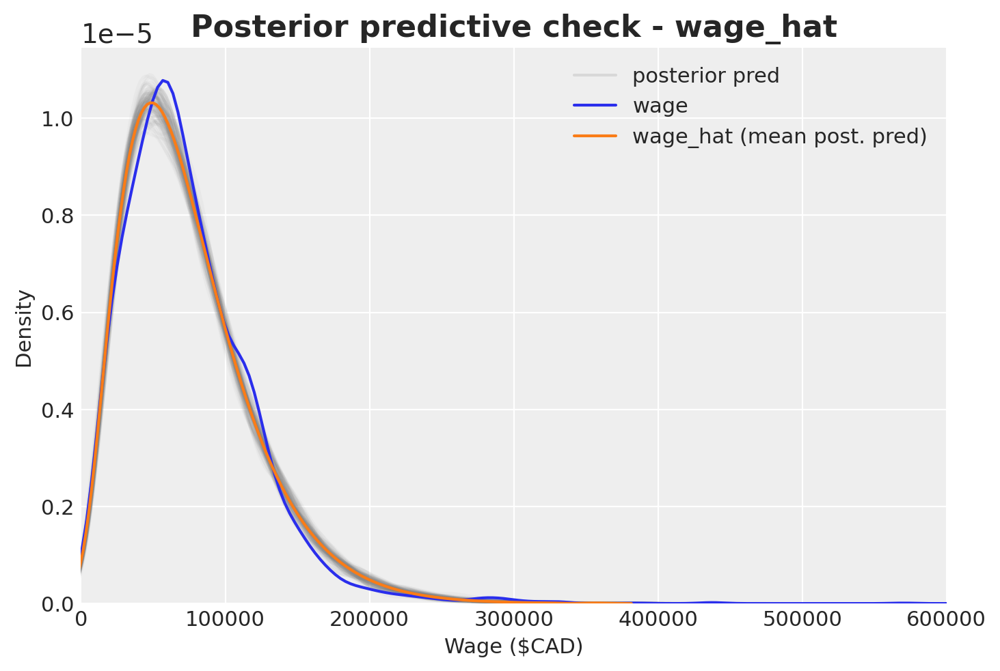

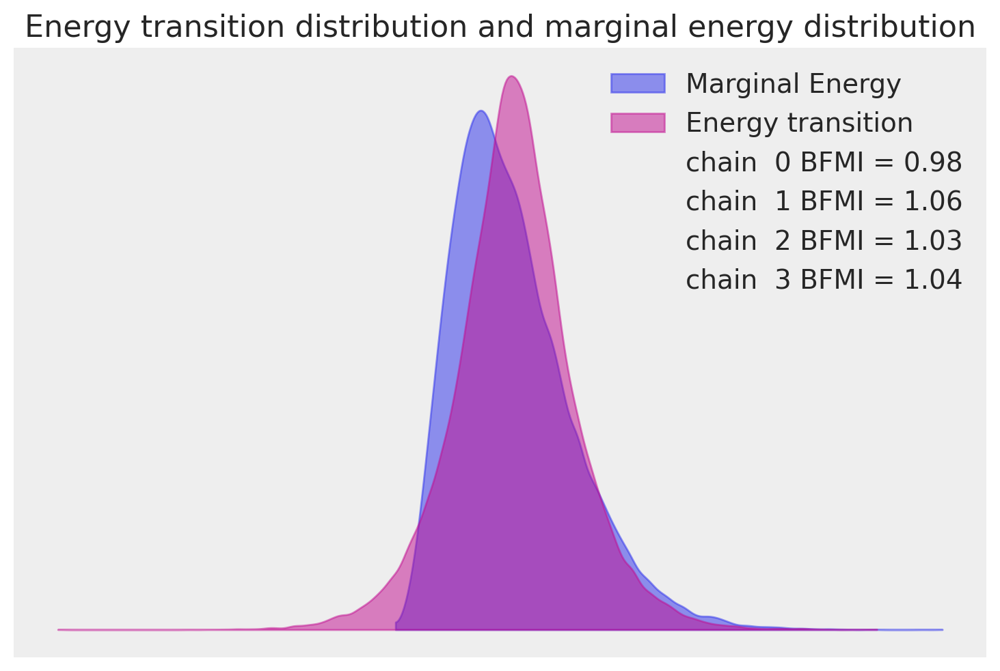

In [116]:
with test:
    # extract posterior predictive samples
    posterior_pred = pm.sample_posterior_predictive(trace)
    # Plot posterior distribution of model parameters
    # az.plot_posterior(trace, var_names=["~offset","~mu","~sigma_"], filter_vars="like", textsize=9);
    # Plot posterior predictive check on the objective variable
    plot_posterior_pred_check(var_obj="wage_hat", ndata=4427, nchains=4, ndraws=10000, infer_data=posterior_pred, n_samples=100)
    # Plot energy plot (to check model's convergence)
    az.plot_energy(
        data=trace,
        fill_color=('C0', 'C3'),
        fill_alpha=(0.5, 0.5),
    ).set(title='Energy transition distribution and marginal energy distribution');

In [117]:
with test:
    advi = pm.fit(100000)

Finished [100%]: Average Loss = 53,158


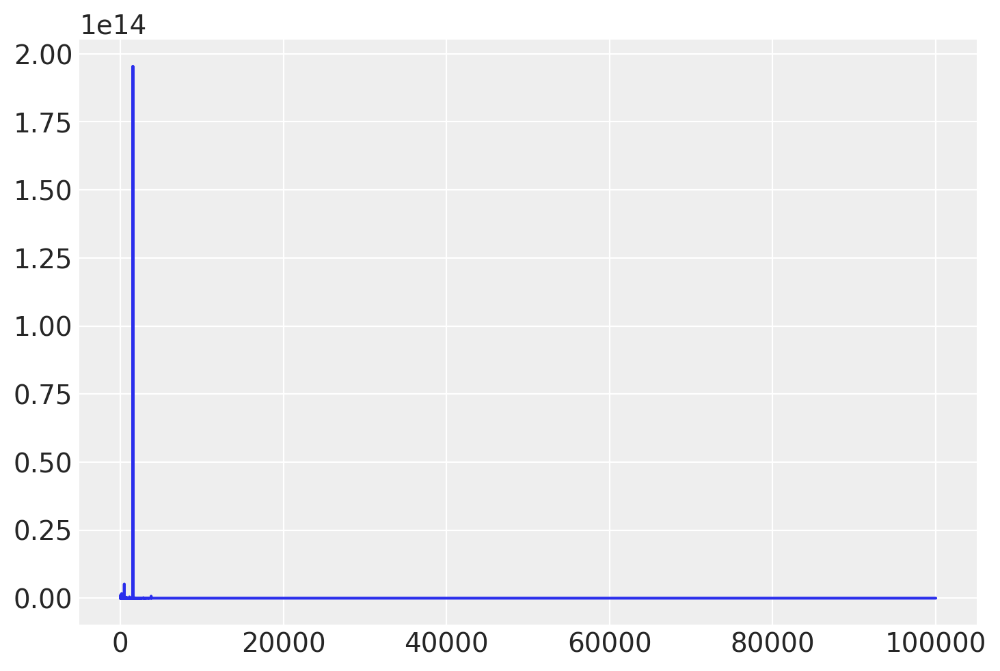

In [118]:
fig, ax = plt.subplots()
ax.plot(advi.hist)

# ax.set_ylim(0, 1e16);

In [133]:
with test:
    mean_field = pm.fit(1000000,
        method="svgd", callbacks=[pm.callbacks.CheckParametersConvergence(diff="absolute")]
    )

Convergence achieved at 388700


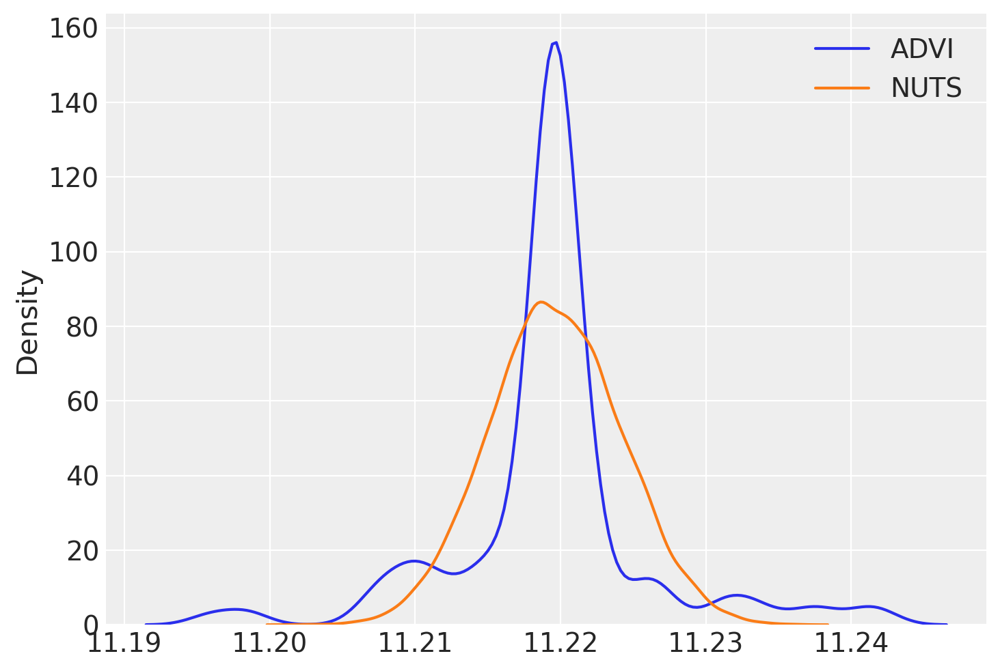

In [134]:
fig, ax = plt.subplots()

sns.kdeplot(mean_field.sample(2000).posterior['alpha_ind'].values[0], ax=ax, label="ADVI", legend=True)
sns.kdeplot(trace.posterior["alpha_ind"].mean(axis=(0)), ax=ax, label="NUTS", legend=True)

# for ind in mean_field.sample(2000).posterior['alpha_ind'].values[0].T[:1]:
#     sns.kdeplot(ind, ax=ax, label="ADVI", legend=True)

# for ind in trace.posterior["alpha_ind"].mean(axis=(0)).T[:1]:
#     sns.kdeplot(ind, ax=ax, label="NUTS", legend=True)

ax.legend()



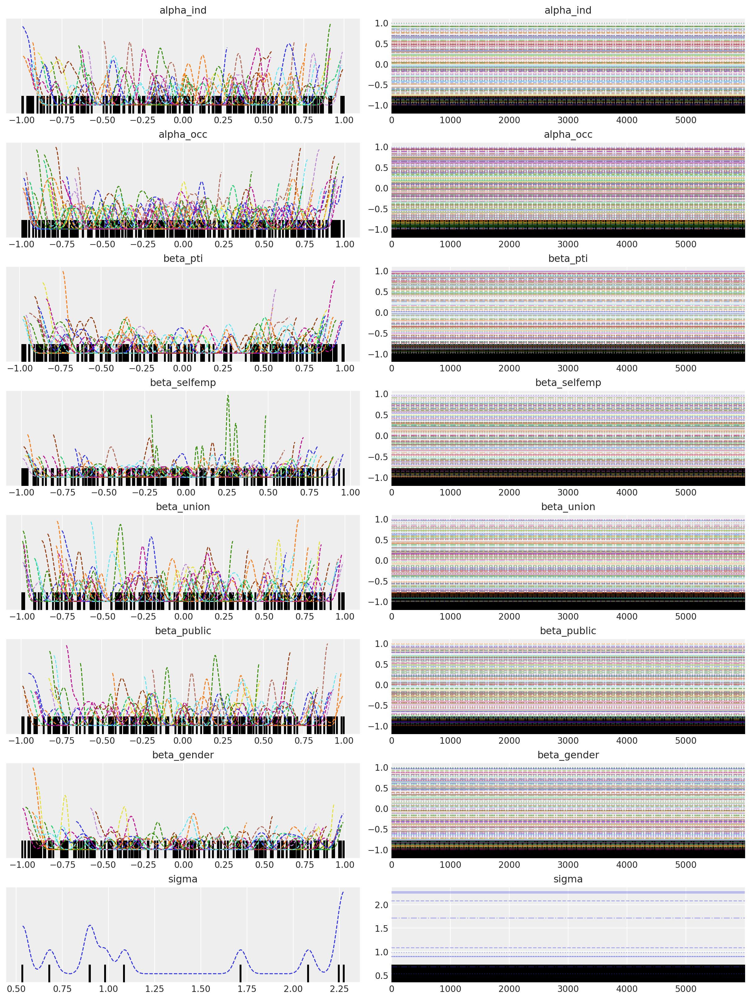

In [42]:
az.plot_trace(trace, var_namaes=["~offset","~mu","~sigma_"], filter_vars="like", combined=True);

In [48]:
pm.summary(trace, var_names=["~offset","~mu","~sigma_"], filter_vars="like").to_csv("wages_model_summary1.csv")

Sampling: [wage_hat]


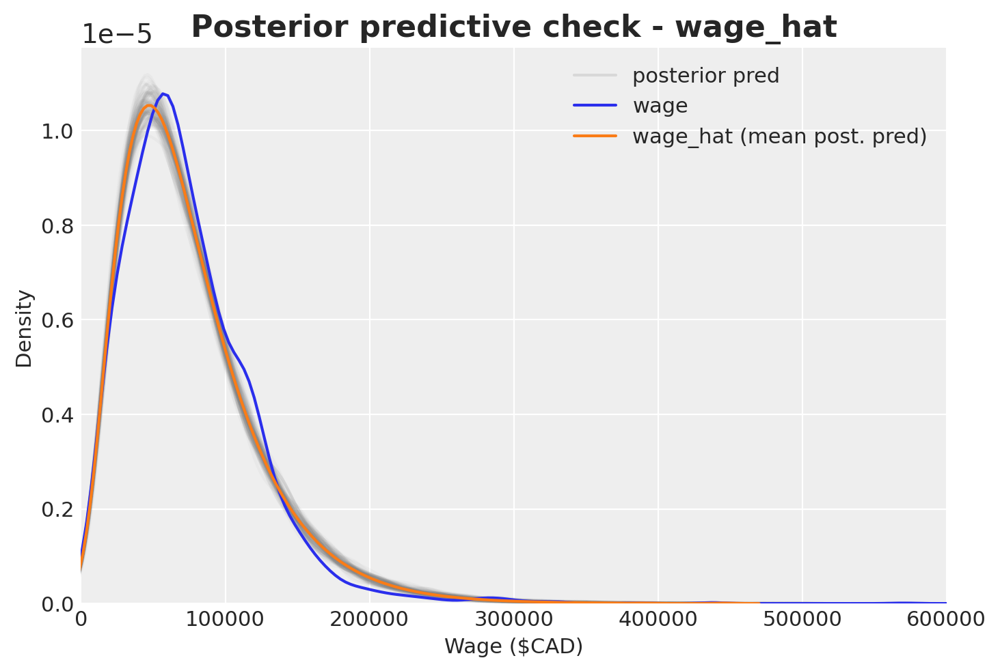

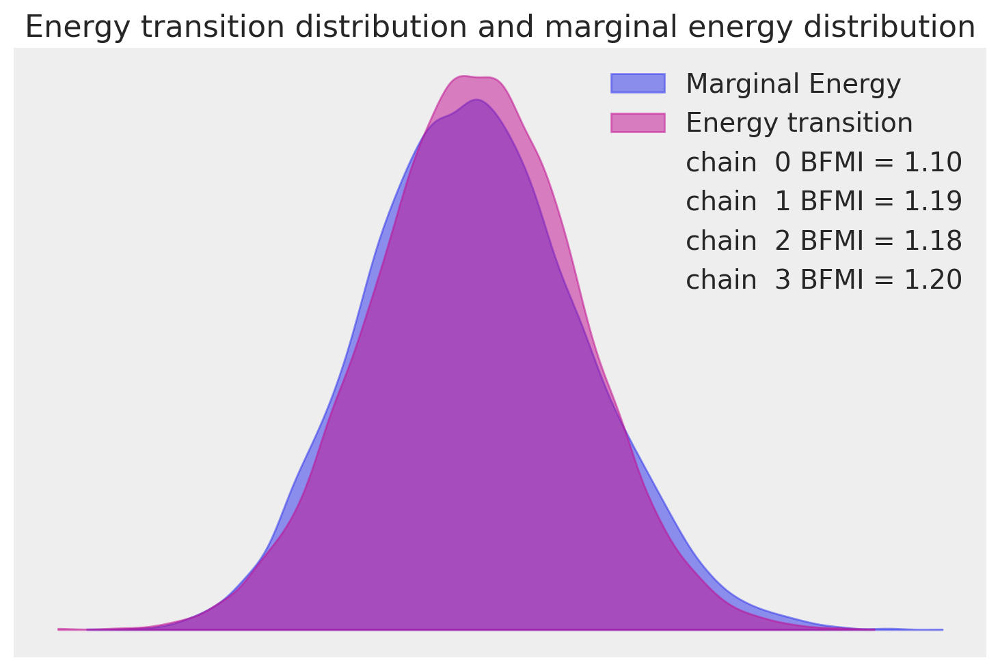

In [49]:
with test:
    # extract posterior predictive samples
    posterior_pred = pm.sample_posterior_predictive(trace, model=test)
    # Plot posterior distribution of model parameters
    az.plot_posterior(trace, var_names=["~offset","~mu","~sigma_"], filter_vars="like", textsize=9);
    # Plot posterior predictive check on the objective variable
    plot_posterior_pred_check(var_obj="wage_hat", ndata=4427, nchains=4, ndraws=5000, infer_data=posterior_pred, n_samples=100)
    # Plot energy plot (to check model's convergence)
    az.plot_energy(
        data=trace,
        fill_color=('C0', 'C3'),
        fill_alpha=(0.5, 0.5),
    ).set(title='Energy transition distribution and marginal energy distribution');

Sampling: [y]


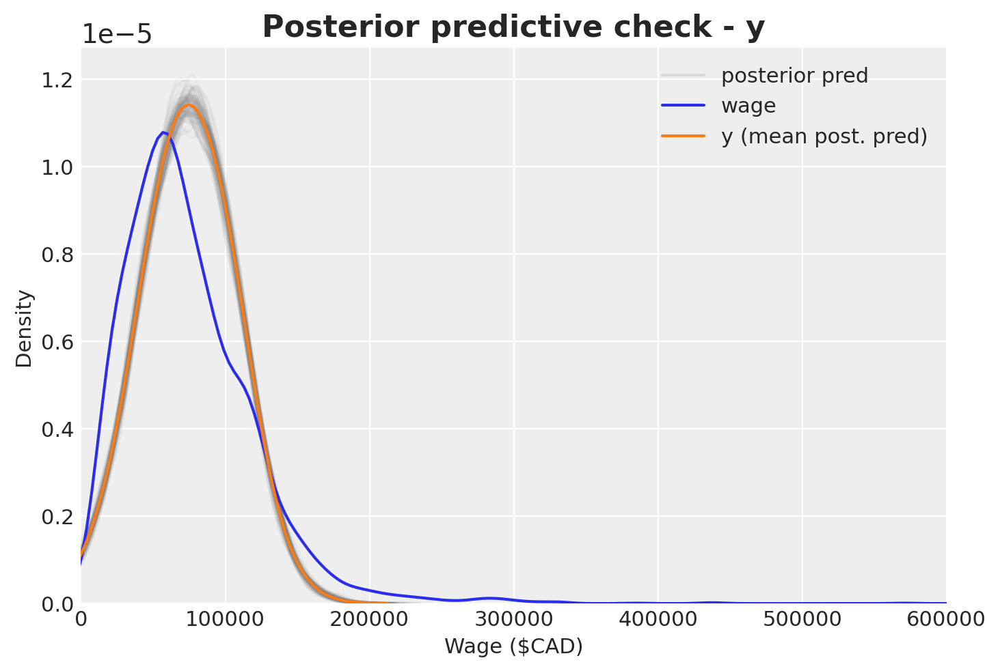

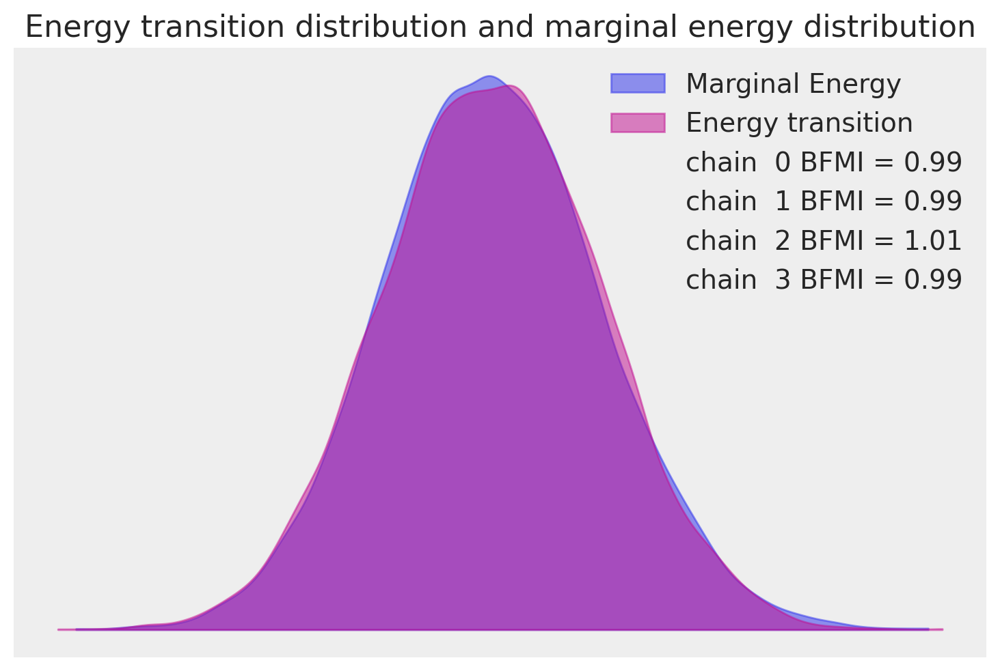

In [40]:
with test:
    # extract posterior predictive samples
    posterior_pred = pm.sample_posterior_predictive(trace, model=test)
    # Plot posterior distribution of model parameters
    az.plot_posterior(trace, var_names=["~offset","~mu","~sigma_"], filter_vars="like", textsize=9);
    # Plot posterior predictive check on the objective variable
    plot_posterior_pred_check(var_obj="y", ndata=4427, nchains=4, ndraws=5000, infer_data=posterior_pred, n_samples=100)
    # Plot energy plot (to check model's convergence)
    az.plot_energy(
        data=trace,
        fill_color=('C0', 'C3'),
        fill_alpha=(0.5, 0.5),
    ).set(title='Energy transition distribution and marginal energy distribution');

### 1-Level | Varying intercepts and slopes

In [18]:
ind_idx, industries = pd.factorize(df['ind'])
occ_idx, occ = pd.factorize(df['occ'])
ptm_idx, ptm = pd.factorize(df['ptm'])
abc_idx, abc = pd.factorize(df['abc'])
self_idx, selfemp = pd.factorize(df['self_emp'])
union_idx, union = pd.factorize(df['union'])
public_idx, public = pd.factorize(df['public_sector'])
multjob_idx, multjob = pd.factorize(df['multiple_jobs'])
salary = df['salary'].values

COORDS = {
    "obs": df.index,
    "ind": industries,
    "occ": occ,
    "ptm": ptm,
    "abc": abc
}

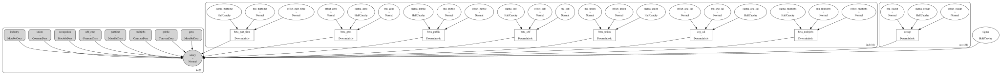

In [19]:
with pm.Model(coords=COORDS) as test:
    # Data
    industry = pm.MutableData('industry', ind_idx)
    occupation = pm.MutableData('occupation', occ_idx)
    parttime = pm.MutableData('parttime', ptm_idx)
    gens = pm.MutableData('gens', abc_idx)
    self_emp = pm.Data('self_emp', self_idx)
    unions = pm.Data('union', union_idx)
    publics = pm.Data('public', public_idx)
    multjobs = pm.Data('multjobs', multjob_idx)


    # Hyperpriors
    mu_avg_sal = pm.Normal('mu_avg_sal', mu=0, sigma=1, dims='ind')
    sigma_avg_sal = pm.HalfCauchy('sigma_avg_sal', 1, dims='ind')
    mu_occup = pm.Normal('mu_occup', mu=0, sigma=1, dims='occ')
    sigma_occup = pm.HalfCauchy('sigma_occup', 1, dims='occ')
    mu_parttime = pm.Normal('mu_parttime', mu=0, sigma=1, dims='ind')
    sigma_parttime = pm.HalfCauchy('sigma_parttime', 1, dims='ind')
    mu_gens = pm.Normal('mu_gens', mu=0, sigma=1, dims='ind')
    sigma_gens = pm.HalfCauchy('sigma_gens', 1, dims='ind')
    mu_self = pm.Normal('mu_self', mu=0, sigma=1, dims='ind')
    sigma_self = pm.HalfCauchy('sigma_self', 1, dims='ind')
    mu_union = pm.Normal('mu_union', mu=0, sigma=1, dims='ind')
    sigma_union = pm.HalfCauchy('sigma_union', 1, dims='ind')
    mu_public = pm.Normal('mu_public', mu=0, sigma=1, dims='ind')
    sigma_public = pm.HalfCauchy('sigma_public', 1, dims='ind')
    mu_multjobs = pm.Normal('mu_multjobs', mu=0, sigma=1, dims='ind')
    sigma_multjobs = pm.HalfCauchy('sigma_multjobs', 1, dims='ind')

    # Priors
    offset_avg_sal = pm.Normal('offset_avg_sal', mu=0, sigma=1, dims='ind')
    avg_sal = pm.Deterministic('avg_sal', mu_avg_sal + offset_avg_sal * sigma_avg_sal, dims='ind')
    offset_occup = pm.Normal('offset_occup', mu=0, sigma=1, dims='occ')
    occup = pm.Deterministic('occup', mu_occup + offset_occup * sigma_occup, dims='occ')
    offset_parttime = pm.Normal('offset_part_time', mu=0, sigma=1, dims='ind')
    part_time = pm.Deterministic('beta_part_time', mu_parttime + offset_parttime * sigma_parttime, dims='ind')
    offset_gens = pm.Normal('offset_gens', mu=0, sigma=1, dims='ind')
    gen = pm.Deterministic('beta_gens', mu_gens + offset_gens * sigma_gens, dims='ind')
    offset_self = pm.Normal('offset_self', mu=0, sigma=1, dims='ind')
    selfempl = pm.Deterministic('beta_self', mu_self + offset_self * sigma_self, dims='ind')
    offset_union = pm.Normal('offset_union', mu=0, sigma=1, dims='ind')
    union = pm.Deterministic('beta_union', mu_union + offset_union * sigma_union, dims='ind')
    offset_public = pm.Normal('offset_public', mu=0, sigma=1, dims='ind')
    public = pm.Deterministic('beta_public', mu_public + offset_public * sigma_public, dims='ind')
    offset_multjobs = pm.Normal('offset_multjobs', mu=0, sigma=1, dims='ind')
    multjob_s = pm.Deterministic('beta_multjobs', mu_multjobs + offset_multjobs * sigma_multjobs, dims='ind')

    # Expected value
    avgsal_ind_occ = avg_sal[industry] + occup[occupation]
    mu = avgsal_ind_occ + part_time[industry] * parttime + gen[industry] * gens + selfempl[industry] * self_emp + union[industry] * unions + public[industry] * publics + multjob_s[industry] * multjobs

    # Model error
    sigma = pm.HalfCauchy('sigma', 1)

    # Likelyhood
    y = pm.Normal('salary', mu=mu, sigma=sigma, observed=salary)

# Model graph
pm.model_to_graphviz(test)

In [20]:
with test:
    trace = pmjax.sample_numpyro_nuts(draws=3000, tune=3000, target_accept=0.95)

Compiling...
Compilation time =  0:00:04.075397
Sampling...


  0%|          | 0/6000 [00:00<?, ?it/s]

  0%|          | 0/6000 [00:00<?, ?it/s]

  0%|          | 0/6000 [00:00<?, ?it/s]

  0%|          | 0/6000 [00:00<?, ?it/s]

Sampling time =  0:29:31.779352
Transforming variables...
Transformation time =  0:00:00.139185


In [21]:
pm.summary(trace, var_names=["~offset_","~mu_","~sigma_"], filter_vars="like").to_csv("wages_model_summary.csv")

### 2-Levels | Varying intercepts and slopes

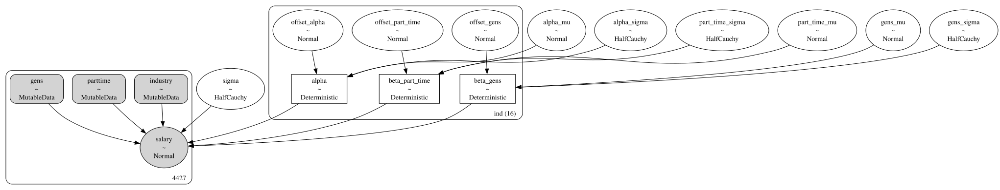

In [ ]:
with pm.Model(coords=COORDS) as test:
    # Data
    industry = pm.MutableData('industry', ind_idx)
    parttime = pm.MutableData('parttime', ptm_idx)
    gens = pm.MutableData('gens', abc_idx)

    # Hyperpriors
    alpha_mu = pm.Normal('alpha_mu', mu=0, sigma=1)
    alpha_sigma = pm.HalfCauchy('alpha_sigma', 1)
    part_time_mu = pm.Normal('part_time_mu', mu=0, sigma=1)
    part_time_sigma = pm.HalfCauchy('part_time_sigma', 1)
    gens_mu = pm.Normal('gens_mu', mu=0, sigma=1)
    gens_sigma = pm.HalfCauchy('gens_sigma', 1)

    # Priors
    offset_alpha = pm.Normal('offset_alpha', mu=0, sigma=1, dims='ind')
    alpha = pm.Deterministic('alpha', alpha_mu + offset_alpha * alpha_sigma, dims='ind')
    offset_part_time = pm.Normal('offset_part_time', mu=0, sigma=1, dims='ind')
    part_time = pm.Deterministic('beta_part_time', part_time_mu + offset_part_time * part_time_sigma, dims='ind')
    offset_gens = pm.Normal('offset_gens', mu=0, sigma=1, dims='ind')
    gen = pm.Deterministic('beta_gens', gens_mu + offset_gens * gens_sigma, dims='ind')

    # Expected value
    mu = alpha[industry] + part_time[industry] * parttime + gen[industry] * gens

    # Model error
    sigma = pm.HalfCauchy('sigma', 1)

    # Likelyhood
    y = pm.Normal('salary', mu=mu, sigma=sigma, observed=salary)

# Model graph
pm.model_to_graphviz(test)

In [ ]:
with test:
    trace = pmjax.sample_numpyro_nuts(draws=4000, tune=4000, target_accept=0.95)

Compiling...
Compilation time =  0:00:01.245761
Sampling...


  0%|          | 0/8000 [00:00<?, ?it/s]

  0%|          | 0/8000 [00:00<?, ?it/s]

  0%|          | 0/8000 [00:00<?, ?it/s]

  0%|          | 0/8000 [00:00<?, ?it/s]

Sampling time =  0:03:42.749565
Transforming variables...
Transformation time =  0:00:00.075947


In [ ]:
pm.summary(trace, var_names=["~offset_"], filter_vars="like")

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
alpha_mu,-0.025,1.012,-1.964,1.810,0.006,0.009,25737.0,11963.0,1.0
part_time_mu,0.012,1.003,-1.821,1.942,0.006,0.009,25590.0,11190.0,1.0
gens_mu,0.008,1.014,-1.973,1.818,0.006,0.009,27717.0,11809.0,1.0
alpha_sigma,89353.023,16396.964,62313.651,121256.424,451.696,319.468,1263.0,2303.0,1.0
part_time_sigma,33900.594,7236.985,21463.616,47181.134,124.479,88.028,3249.0,6580.0,1.0
gens_sigma,24009.303,4854.658,15656.845,32984.719,78.794,55.720,3646.0,6498.0,1.0
sigma,42230.564,449.088,41393.430,43067.506,2.716,1.923,27503.0,12528.0,1.0
alpha[construction],78452.968,3140.354,72449.844,84301.355,23.730,16.797,17510.0,12410.0,1.0
"alpha[information, culture and recreation]",81716.285,4105.736,74360.379,89820.442,28.306,20.038,21045.0,14568.0,1.0
alpha[trade],69225.999,2291.011,64982.359,73534.659,16.431,11.629,19436.0,13512.0,1.0


# Tests with multilevel structure

In [37]:
# Simulated data (replace this with your actual data)
np.random.seed(123)
num_employees = 100000
industries = np.random.randint(0, 5, num_employees)
occupations = np.random.randint(0, 10, num_employees)
ages = np.random.randint(22, 65, num_employees)
education_levels = np.random.randint(1, 5, num_employees)
gdp = np.random.uniform(50000, 200000, num_employees)
avg_firm_size_by_occ = np.random.uniform(10, 100, num_employees)

# Parameters
y1 = 5000 * industries + 0.1 * gdp
y2 = y1 + 3000 * occupations + 0.2 * avg_firm_size_by_occ
salaries = y2 + 100 * ages + 2000 * education_levels + np.random.normal(0, 10000, num_employees)

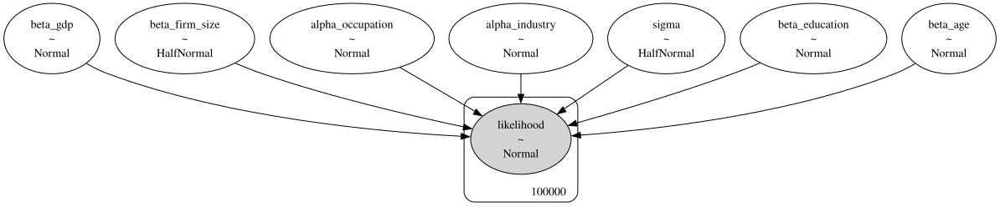

In [42]:

# PyMC hierarchical model
with pm.Model() as hierarchical_model:
    # Hyperparameters
    alpha_industry = pm.Normal('alpha_industry', mu=0, sigma=1000)
    alpha_occupation = pm.Normal('alpha_occupation', mu=0, sigma=1000)
    
    # Level 1: Industry effect
    beta_gdp = pm.Normal('beta_gdp', mu=0, sigma=100)
    y_1 = alpha_industry * industries + beta_gdp * gdp
    
    # Level 2: Occupation effect
    beta_firm_size = pm.HalfNormal('beta_firm_size', sigma=1)
    y_2 = y_1 + alpha_occupation * occupations + beta_firm_size * avg_firm_size_by_occ
    
    # Level 3: Individual employee parameters
    beta_age = pm.Normal('beta_age', mu=0, sigma=100)
    beta_education = pm.Normal('beta_education', mu=2000, sigma=100)
    # Add more individual parameters
    
    # Combine individual parameters
    y_3 = y_2 + beta_age * ages + beta_education * education_levels
    
    # Likelihood
    sigma = pm.HalfNormal('sigma', sigma=1000)
    likelihood = pm.Normal('likelihood', mu=y_3, sigma=sigma, observed=salaries)

# Model graph
pm.model_to_graphviz(hierarchical_model)

In [43]:
# Sampling
with hierarchical_model:
    trace = pmjax.sample_numpyro_nuts(2000, tune=1000)

Compiling...
Compilation time =  0:00:01.225827
Sampling...


  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Sampling time =  0:06:18.148033
Transforming variables...
Transformation time =  0:00:00.007719


In [44]:
pm.summary(trace)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
alpha_industry,4994.969,21.862,4955.036,5036.901,0.226,0.160,9380.0,5510.0,1.0
alpha_occupation,3007.978,10.365,2987.873,3026.654,0.164,0.116,3990.0,4267.0,1.0
beta_gdp,0.099,0.001,0.098,0.100,0.000,0.000,7605.0,6287.0,1.0
beta_age,98.914,1.970,95.299,102.689,0.027,0.019,5238.0,5559.0,1.0
beta_education,2037.830,24.947,1989.501,2083.365,0.482,0.341,2686.0,3219.0,1.0
beta_firm_size,0.594,0.451,0.001,1.400,0.009,0.006,1895.0,1775.0,1.0
sigma,10000.739,22.935,9956.619,10042.690,0.229,0.162,10043.0,5476.0,1.0
